### Libraries and functions

In [1]:
%matplotlib inline

In [2]:
from __future__ import division

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
from vtk_rw import read_vtk
from plotting import plot_surf_stat_map, crop_img
import matplotlib as mpl

/home/raid3/huntenburg/workspace/anaconda2/envs/myelinconnect/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [5]:
def load_pickle(pkl_file):
    pkl_in = open(pkl_file, 'r')
    pkl_dict = pickle.load(pkl_in)
    pkl_in.close()
    return pkl_dict

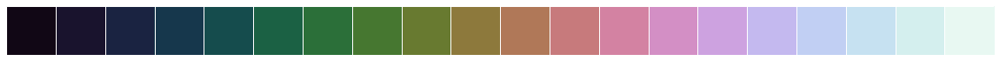

In [6]:
colors = sns.color_palette('cubehelix', 20)
sns.palplot(colors)
pic_folder = '/scr/ilz3/myelinconnect/new_groupavg/pics/manuscript/'

### Load meshes for visualization

In [7]:
lh_mesh_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/inflated/lh_lowres_new_infl100.vtk'
lh_sulc_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/sulc/lh_sulc.npy'
rh_mesh_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/inflated/rh_lowres_new_infl100.vtk'
rh_sulc_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/sulc/rh_sulc.npy'
fullmask_file = '/scr/ilz3/myelinconnect/new_groupavg/masks/fullmask_lh_rh_new.npy'
lh_sulc = np.load(lh_sulc_file)
lv, lf, _ = read_vtk(lh_mesh_file)
rh_sulc = np.load(rh_sulc_file)
rv, rf, _ = read_vtk(rh_mesh_file)
fullmask = np.load(fullmask_file)

## FC embeddings

In [8]:
embed_file='/scr/ilz3/myelinconnect/new_groupavg/embed/both_smooth_3_embed.npy'
dict_file='/scr/ilz3/myelinconnect/new_groupavg/embed/both_smooth_3_embed_dict.pkl'

In [9]:
embed_dict = load_pickle(dict_file)
eigenval=embed_dict['lambdas']
perc_var = eigenval/np.sum(eigenval)*100
#orig_eigenval=embed_dict['orig_lambdas'][1:]
#orig_perc_var = orig_eigenval/np.sum(orig_eigenval)*100

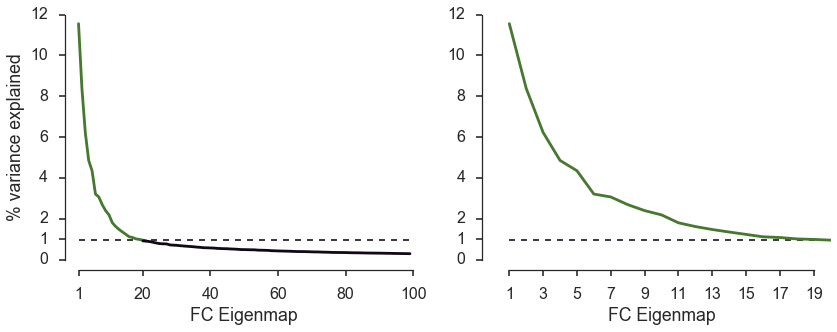

In [40]:
sns.set_context('poster')
sns.set_style("ticks")
fig=plt.figure(figsize=(12,5))

ax1 = fig.add_subplot(121)
plt.plot(np.arange(1,22),perc_var[:21], color=colors[7])
plt.plot(np.arange(20,100), perc_var[20:], color=colors[0])
ax1.hlines(.95, 1, 100, linestyle='--', linewidth=2, colors=colors[0],alpha=0.8)
plt.ylabel('% variance explained')
plt.xlabel('FC Eigenmap')
plt.yticks([0,1,2,4,6,8,10,12])
plt.xticks([1,20,40,60,80,100])

ax2 = fig.add_subplot(122)
plt.plot(np.arange(1,21), perc_var[:20], color=colors[7])
ax2.hlines(.95, 1, 20, linestyle='--', linewidth=2, colors=colors[0],alpha=0.8)
plt.xlabel('FC Eigenmap')
plt.xticks(np.arange(1, 21, 2))
plt.yticks([0,1,2,4,6,8,10,12])
sns.despine(offset=10, trim=True)
fig.tight_layout()

In [ ]:
# normalize vectors
embed_masked = np.zeros((embed_dict['vectors'].shape[0], embed_dict['vectors'].shape[1]-1))
for comp in range(100):
    embed_masked[:,comp]=(embed_dict['vectors'][:,comp+1]/embed_dict['vectors'][:,0])

# unmask the embedding, that has been saved in masked form
idcs=np.arange(0,(lv.shape[0]+rv.shape[0]))
nonmask=np.delete(idcs, fullmask)
embed = np.zeros(((lv.shape[0]+rv.shape[0]),100))
embed[nonmask] = embed_masked

cropped_embed_rh = []
cropped_embed_lh = []

# create plots
sns.set_style('white')
for comp in range(2):
    
    for (elev, azim) in [(180, 0), (180, 180)]:
        plot=plot_surf_stat_map(lv, lf, stat_map=embed[:lv.shape[0],comp], bg_map=lh_sulc, bg_on_stat=True, darkness=0.5, 
                            elev=elev,azim=azim, figsize=(10,8) ,threshold=1e-50, cmap='inferno',symmetric_cbar='auto')
        cropped_embed_lh.append(crop_img(plot))

    for (elev, azim) in [(180, 0), (180, 180)]:
        plot=plot_surf_stat_map(rv, rf, stat_map=embed[lv.shape[0]:,comp], bg_map=rh_sulc, bg_on_stat=True, darkness=0.5, 
                            elev=elev,azim=azim, figsize=(10,8) ,threshold=1e-50, cmap='inferno',symmetric_cbar='auto')
        cropped_embed_rh.append(crop_img(plot))

In [ ]:
sns.set_style('white')
fig = plt.figure(figsize=(20,50))
for img in range(2):
    ax = fig.add_subplot(10,2,img+1)
    plt.imshow(cropped_embed_rh[img])
    ax.set_axis_off
    ax.set_axis_off()
fig.tight_layout()
fig.subplots_adjust(right=0.65)

In [ ]:
sns.set_style('white')
fig = plt.figure(figsize=(20,50))
for img in range(2):
    ax = fig.add_subplot(10,2,img+1)
    plt.imshow(cropped_embed_lh[img])
    ax.set_axis_off
    ax.set_axis_off()
fig.tight_layout()
fig.subplots_adjust(right=0.65)

## Prediction of T1 with FC on group level

In [8]:
t1_predict_file_0 = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1avg/both_t1avg_by_fc_maps_0.pkl'
t1_predict_file_best = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1avg/both_t1avg_by_fc_maps_best.pkl'
t1_predict_0 = load_pickle(t1_predict_file_0)
t1_predict_best = load_pickle(t1_predict_file_best)

In [10]:
print '0', t1_predict_0['corr'], t1_predict_0['score']
print '10', t1_predict_best['corr'], t1_predict_best['score']

0 (0.53748407053959679, 0.0) 0.288889126084
10 (0.7884965277790339, 0.0) 0.62172677432


### maps of models

In [11]:
sns.set_style('white')
cropped_images_lh = []
for data in [t1_predict_0['t1'], t1_predict_0['modelled_fit'], t1_predict_10['modelled_fit']]:
    for (elev, azim) in [(180, 0), (180, 180)]:
        plot=plot_surf_stat_map(lv, lf, stat_map=data[:lv.shape[0]], bg_map=lh_sulc, bg_on_stat=True, darkness=0.4, 
                            elev=elev,azim=azim, figsize=(10,9) ,threshold=1500, cmap='cubehelix',
                            vmin=1500, vmax=2400, symmetric_cbar=False)
        cropped_images_lh.append(crop_img(plot))

In [12]:
sns.set_style('white')
cropped_images_rh = []
for data in [t1_predict_0['t1'], t1_predict_0['modelled_fit'], t1_predict_10['modelled_fit']]:
    for (elev, azim) in [(180, 0), (180, 180)]:
        plot=plot_surf_stat_map(rv, rf, stat_map=data[lv.shape[0]:], bg_map=rh_sulc, bg_on_stat=True, darkness=0.4, 
                            elev=elev,azim=azim, figsize=(10,7.5) ,threshold=1500, cmap='cubehelix',
                            vmin=1500, vmax=2400, symmetric_cbar=False)
        cropped_images_rh.append(crop_img(plot))

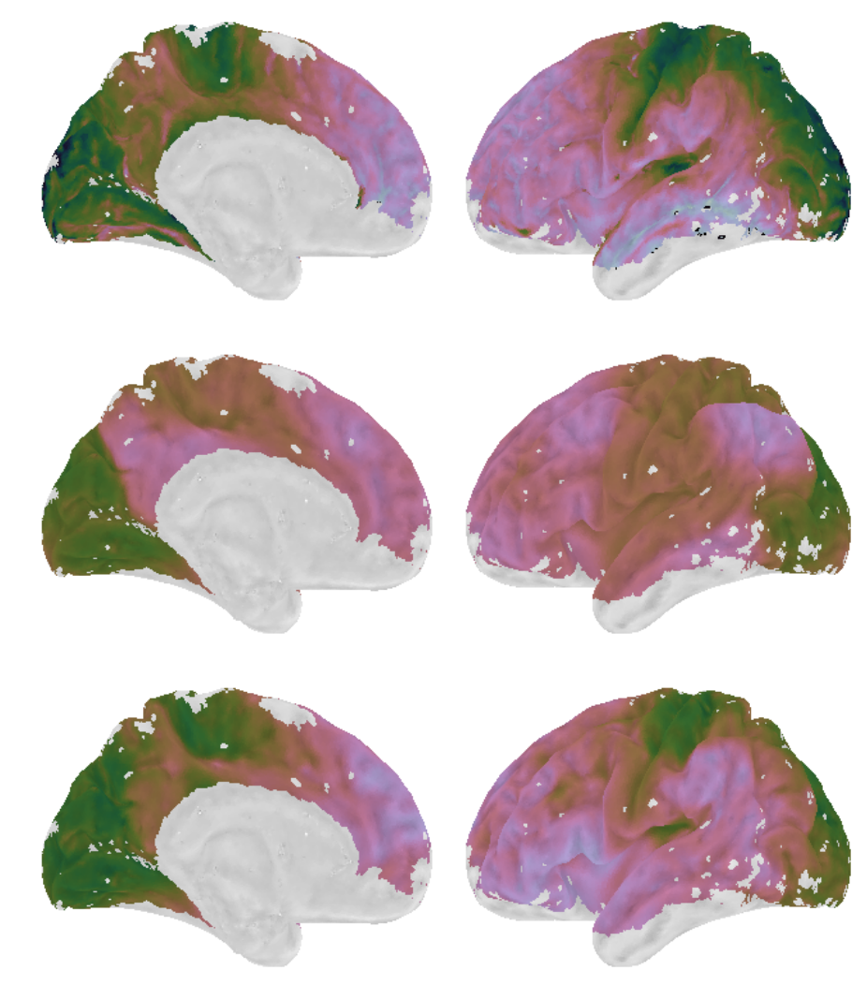

In [13]:
sns.set_style('white')
fig1a_left = plt.figure(figsize=(20,15))
for img in range(len(cropped_images_lh)):
    ax = fig1a_left.add_subplot(3,2,img+1)
    plt.imshow(cropped_images_lh[img])
    ax.set_axis_off()
fig1a_left.tight_layout()
fig1a_left.subplots_adjust(right=0.7)

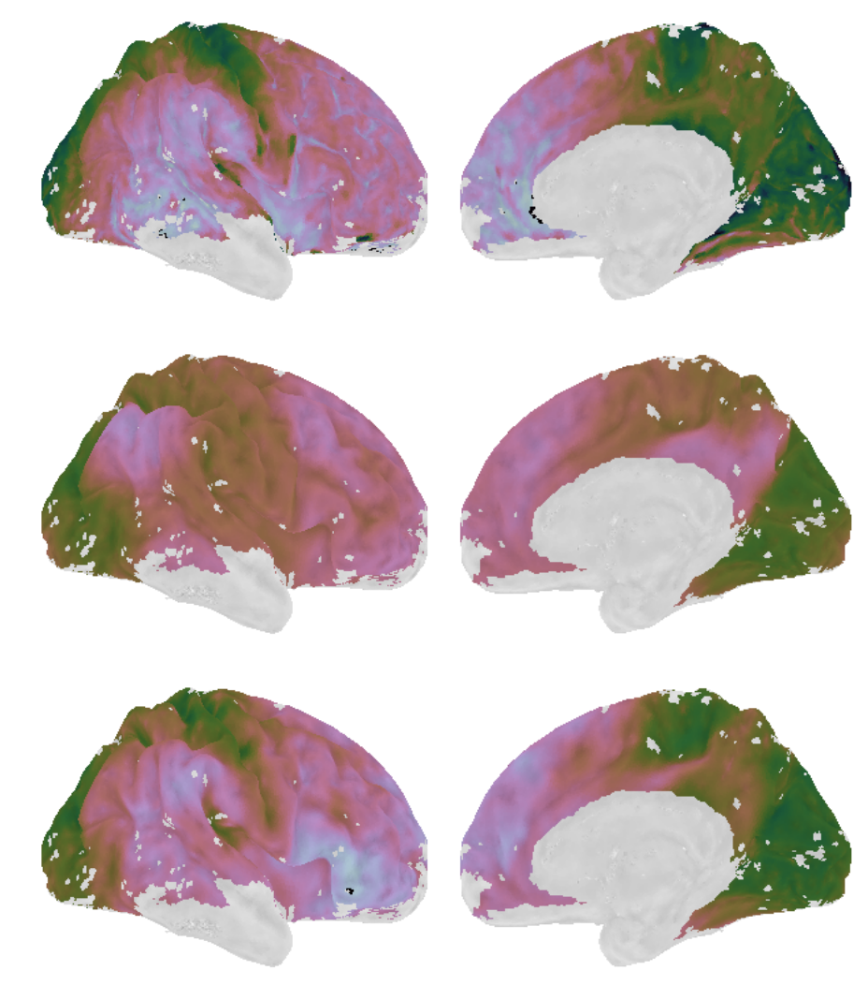

In [14]:
sns.set_style('white')
fig1a_right = plt.figure(figsize=(20,15))
for img in range(len(cropped_images_rh)):
    ax = fig1a_right.add_subplot(3,2,img+1)
    plt.imshow(cropped_images_rh[img])
    ax.set_axis_off()
fig1a_right.tight_layout()
fig1a_right.subplots_adjust(right=0.7)

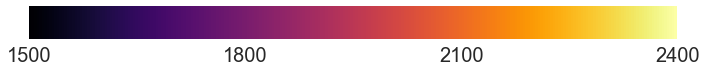

In [24]:
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=2)

inferno = plt.get_cmap('inferno')
norm = mpl.colors.Normalize(vmin=1500, vmax=2400)

fig1_hcbar = plt.figure(figsize=(10, 3))
ax1 = fig1_hcbar.add_axes([0.05, 0.80, 0.9, 0.15])
mpl.colorbar.ColorbarBase(ax1, cmap=inferno,norm=norm,orientation='horizontal', ticks=[1500, 1800, 2100, 2400])

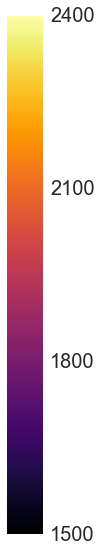

In [25]:
fig1_vcbar = plt.figure(figsize=(10, 8))
ax1 = fig1_vcbar.add_axes([0.05, 0.05, 0.05, 0.9])
mpl.colorbar.ColorbarBase(ax1, cmap=inferno,norm=norm,orientation='vertical', ticks=[1500, 1800, 2100, 2400])

### residuals

In [32]:
vmax = max(np.abs([t1_predict_0['residuals'].min(), t1_predict_0['residuals'].max(), 
               t1_predict_10['residuals'].min(), t1_predict_10['residuals'].max()]))

sns.set_style('white')
sns.set_context('poster')
cropped_res_lh = []
cropped_res_rh = []

for data in [t1_predict_0['residuals'], t1_predict_10['residuals']]:
    for (elev, azim) in [(180, 0), (180, 180)]:
        plot_lh=plot_surf_stat_map(lv, lf, stat_map=data[:lv.shape[0]], bg_map=lh_sulc, bg_on_stat=True, darkness=0.4, 
                            elev=elev,azim=azim, figsize=(10,9) ,threshold=1e-50, cmap='RdBu_r',
                            vmax=vmax, symmetric_cbar='auto')
        cropped_res_lh.append(crop_img(plot_lh))
        plot_rh=plot_surf_stat_map(rv, rf, stat_map=data[lv.shape[0]:], bg_map=rh_sulc, bg_on_stat=True, darkness=0.4, 
                            elev=elev,azim=azim, figsize=(10,7.5) ,threshold=1e-50, cmap='RdBu_r',
                            vmax=vmax, symmetric_cbar='auto')
        cropped_res_rh.append(crop_img(plot_rh))

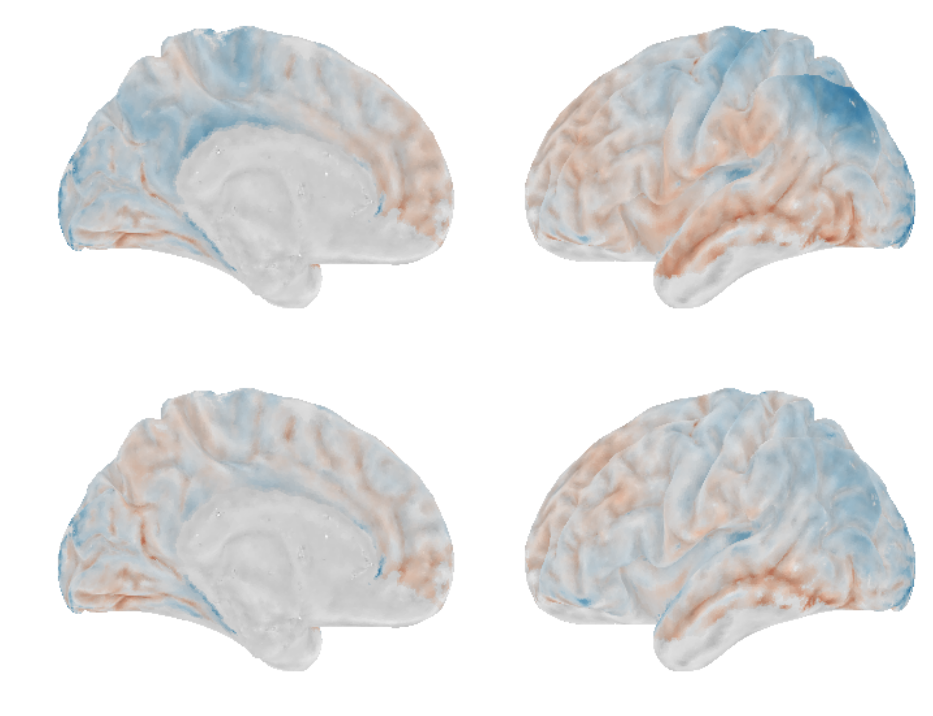

In [33]:
sns.set_style('white')
sns.set_context('poster')

fig1c_left = plt.figure(figsize=(20,15))
for img in range(len(cropped_res_lh)):
    ax = fig1c_left.add_subplot(3,2,img+1)
    plt.imshow(cropped_res_lh[img])
    ax.set_axis_off()
fig1c_left.tight_layout()
fig1c_left.subplots_adjust(right=0.65)

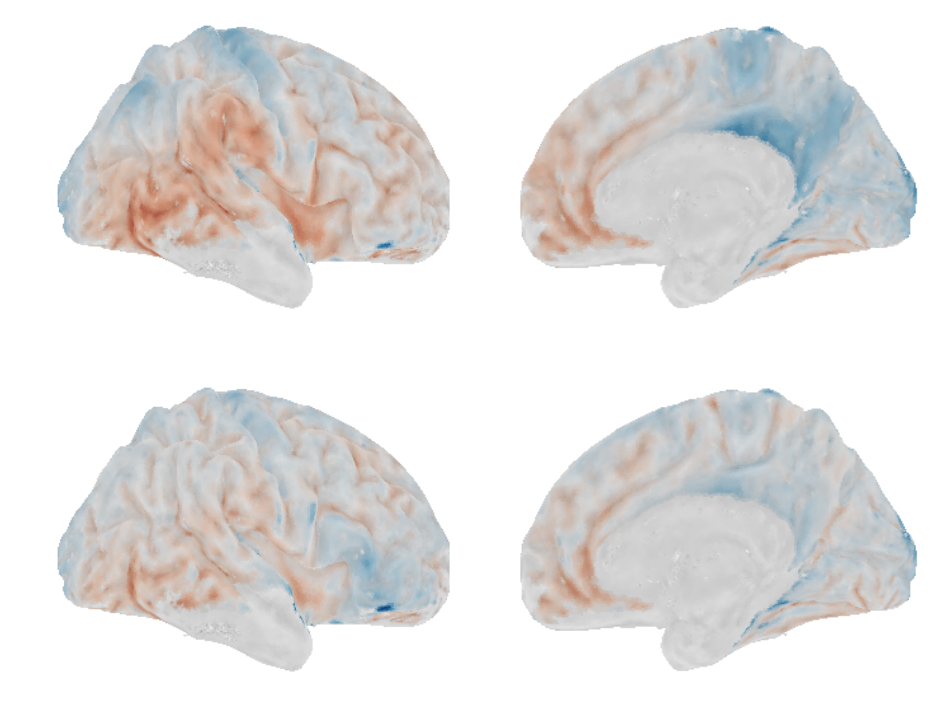

In [34]:
sns.set_style('white')
sns.set_context('poster')
fig1c_right = plt.figure(figsize=(20,15))
for img in range(len(cropped_res_rh)):
    ax = fig1c_right.add_subplot(3,2,img+1)
    plt.imshow(cropped_res_rh[img])
    ax.set_axis_off()
fig1c_right.tight_layout()
fig1c_right.subplots_adjust(right=0.65)

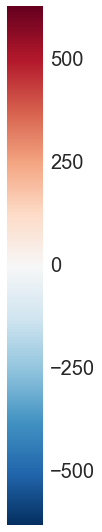

In [37]:
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=2)

rdbu = plt.get_cmap('RdBu_r')
norm = mpl.colors.Normalize(vmin=-vmax, vmax=vmax)

fig1_res_vcbar = plt.figure(figsize=(10, 8))
ax1 = fig1_res_vcbar.add_axes([0.05, 0.05, 0.05, 0.9])
mpl.colorbar.ColorbarBase(ax1, cmap=rdbu,norm=norm,orientation='vertical', ticks=[-500, -250, 0, 250, 500])

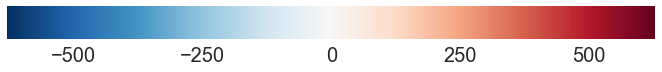

In [39]:
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=2)

rdbu = plt.get_cmap('RdBu_r')
norm = mpl.colors.Normalize(vmin=-vmax, vmax=vmax)

fig1_res_hcbar = plt.figure(figsize=(10, 3))
ax1 = fig1_res_hcbar.add_axes([0.05, 0.80, 0.9, 0.15])
mpl.colorbar.ColorbarBase(ax1, cmap=rdbu,norm=norm,orientation='horizontal', ticks=[-500, -250, 0, 250, 500])#, ticks=[1500, 1800, 2100, 2400])

### scatter plots

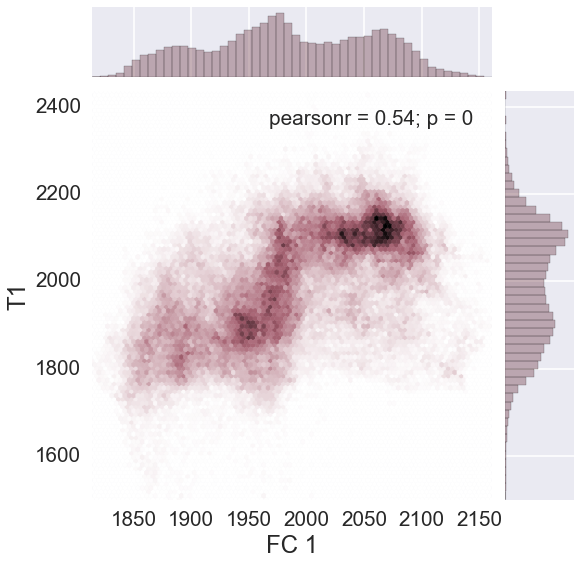

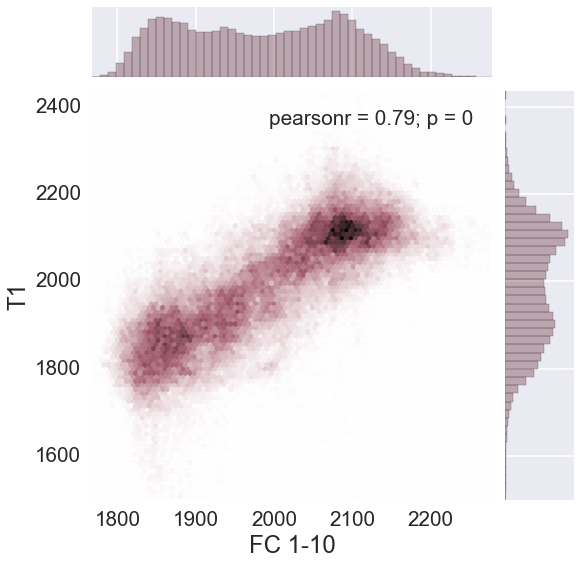

In [41]:
sns.set_style('darkgrid')
sns.set_context('poster', font_scale=1.3)

scatter_mask = np.where(t1_predict_0['t1']>1500)
fig1b_1 = sns.jointplot(t1_predict_0['modelled_fit'][scatter_mask], 
                             t1_predict_0['t1'][scatter_mask], 
                             kind="hex", size=8, color=sns.xkcd_rgb['brownish purple'])
fig1b_1.set_axis_labels('FC 1', 'T1', fontsize=24)

fig1b_2 = sns.jointplot(t1_predict_10['modelled_fit'][scatter_mask], 
                             t1_predict_0['t1'][scatter_mask], 
                             kind="hex", size=8, color=sns.xkcd_rgb['brownish purple'])
fig1b_2.set_axis_labels('FC 1-10', 'T1', fontsize=24)

In [42]:
fig1_res_vcbar.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_res_vcbar.svg')
fig1_res_hcbar.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_res_hcbar.svg')
fig1_hcbar.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_maps_hcbar.svg')
fig1_vcbar.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_maps_vcbar.svg')
fig1a_left.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_maps_left.png')
fig1a_right.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_maps_right.png')
fig1c_left.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_res_left.png')
fig1c_right.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_res_right.png')
fig1b_1.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_scatter_0.png')
fig1b_2.savefig('/scr/ilz3/myelinconnect/new_groupavg/pics/both_hemi/fig1_scatter_10.png')

## Figure 2: random data

In [11]:
df_0 = pd.DataFrame(columns=['rh score', 'rh corr', 'rh coeff', 'lh score', 'lh corr', 'lh coeff'], index=['smooth_3', 'smooth_6', 'smooth_12', 'smooth_20'])
df_10 = pd.DataFrame(columns=['rh score', 'rh corr', 'rh coeff', 'lh score', 'lh corr', 'lh coeff'], index=['smooth_3', 'smooth_6', 'smooth_12', 'smooth_20'])


In [12]:
random_data_file = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/random/%s_random_%s_%s_t1avg_by_fc_maps_%s.pkl'

In [13]:
single_hem_files = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1avg/%s_t1avg_by_fc_maps_%s.pkl'
t1_predict_rh_0 = load_pickle(single_hem_files%('rh', '0'))
t1_predict_rh_10 = load_pickle(single_hem_files%('rh', '0_to_10'))
t1_predict_lh_0 = load_pickle(single_hem_files%('lh', '0'))
t1_predict_lh_10 = load_pickle(single_hem_files%('lh', '0_to_10'))

### distributions

In [20]:
maps='0'
for smooth in ['smooth_3', 'smooth_6', 'smooth_12', 'smooth_20']:
    
    for hemi in ['rh', 'lh']:


        scores = []
        corrs = []
        coeffs = []
        count = 0

        for iteration in range(100):
            pkl_in = open(random_data_file%(hemi, iteration, smooth, maps), 'r')
            random_data = pickle.load(pkl_in)
            pkl_in.close()
            scores.append(random_data['score'])
            corrs.append(random_data['corr'][0])
            coeffs.append(random_data['coef'])
            count += 1


        df_0['%s score'%hemi][smooth] = scores
        df_0['%s corr'%hemi][smooth] = corrs
        df_0['%s coeff'%hemi][smooth] = coeffs

In [22]:
maps='0_to_10'
for smooth in ['smooth_3', 'smooth_6', 'smooth_12', 'smooth_20']:
    
    for hemi in ['rh', 'lh']:


        scores = []
        corrs = []
        coeffs = []
        count = 0

        for iteration in range(100):
            pkl_in = open(random_data_file%(hemi, iteration, smooth, maps), 'r')
            random_data = pickle.load(pkl_in)
            pkl_in.close()
            scores.append(random_data['score'])
            corrs.append(random_data['corr'][0])
            coeffs.append(random_data['coef'])
            count += 1


        df_10['%s score'%hemi][smooth] = scores
        df_10['%s corr'%hemi][smooth] = corrs
        df_10['%s coeff'%hemi][smooth] = coeffs

In [23]:
df_0_tidy = pd.DataFrame(columns=['Pearson correlation', 'R squared', 'Hemisphere', 'Smoothing (FWHM)'])
df_0_tidy['Hemisphere'] = 400*['left']+400*['right']
df_0_tidy['Smoothing (FWHM)'] = 2*(100*[3]+100*[6]+100*[12]+100*[20])
corrs = []
rs = []
for hemi in ['lh', 'rh']:
    for smooth in ['smooth_3', 'smooth_6', 'smooth_12', 'smooth_20']:
        corrs += df_0['%s corr'%hemi][smooth]
        rs += df_0['%s score'%hemi][smooth]

df_0_tidy['Pearson correlation'] = corrs
df_0_tidy['R squared'] = rs


df_10_tidy = pd.DataFrame(columns=['Pearson correlation', 'R squared', 'Hemisphere', 'Smoothing (FWHM)'])
df_10_tidy['Hemisphere'] = 400*['leftt']+400*['right']
df_10_tidy['Smoothing (FWHM)'] = 2*(100*[3]+100*[6]+100*[12]+100*[20])
corrs = []
rs = []
for hemi in ['lh', 'rh']:
    for smooth in ['smooth_3', 'smooth_6', 'smooth_12', 'smooth_20']:
        corrs += df_10['%s corr'%hemi][smooth]
        rs += df_10['%s score'%hemi][smooth]
df_10_tidy['Pearson correlation'] = corrs
df_10_tidy['R squared'] = rs

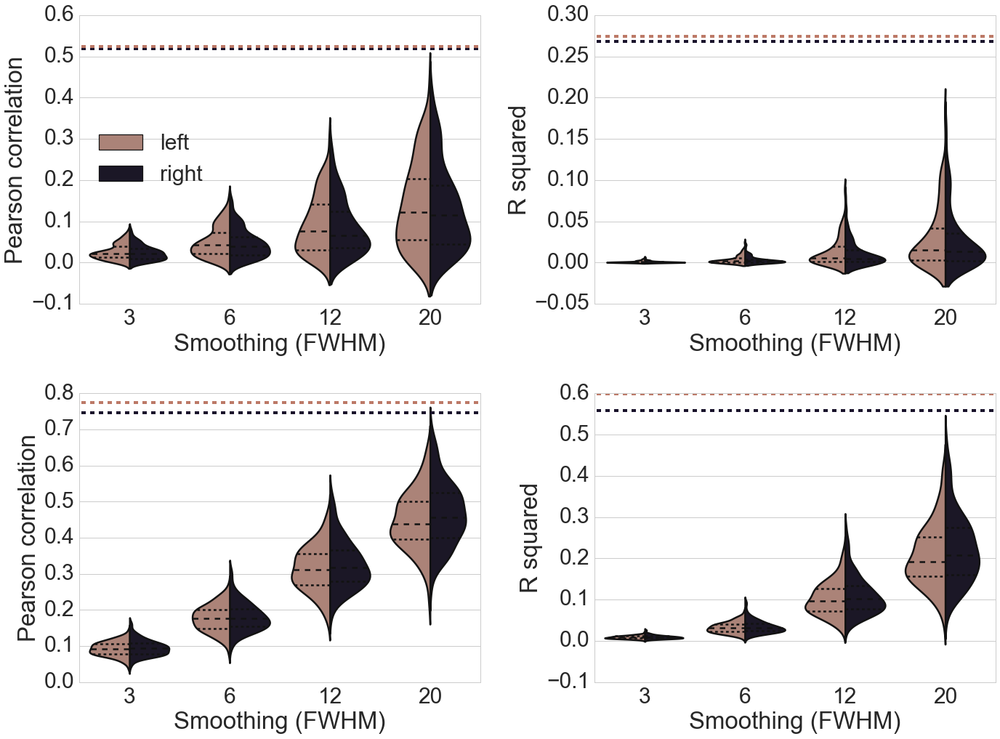

In [83]:
sns.set_style('whitegrid')
sns.set_context('notebook', font_scale=3)
cright = colors[0]#sns.xkcd_rgb['marine blue']
cleft = colors[5]#sns.xkcd_rgb['grass green']
sat = .6
lin = 2.5
fig3a = plt.figure(figsize=(20,15))
crline=colors[0] #sns.xkcd_rgb['rich purple']
clline=colors[5]

fig3a.add_subplot(221)
ax1 = sns.violinplot(x = 'Smoothing (FWHM)', y='Pearson correlation', hue='Hemisphere', data=df_0_tidy, 
               split=True, palette=[cleft,cright], inner='quartile', saturation=sat, linewidth=lin); 
ax1.hlines(t1_predict_rh_0['corr'][0], -1, 4, linestyle='--', linewidth=4, colors=crline)
ax1.hlines(t1_predict_lh_0['corr'][0], -1, 4, linestyle='--', linewidth=4, colors=clline)
plt.legend(loc=6)

fig3a.add_subplot(222)
ax2 = sns.violinplot(x = 'Smoothing (FWHM)', y='R squared', hue='Hemisphere', data=df_0_tidy, 
               split=True, palette=[cleft,cright], inner='quartile', saturation=sat, linewidth=lin); 
ax2.hlines(t1_predict_rh_0['score'], -1, 4, linestyle='--', linewidth=4, colors=crline)
ax2.hlines(t1_predict_lh_0['score'], -1, 4, linestyle='--', linewidth=4, colors=clline)
ax2.legend_.remove()

fig3a.add_subplot(223)
ax3 = sns.violinplot(x = 'Smoothing (FWHM)', y='Pearson correlation', hue='Hemisphere', data=df_10_tidy, 
               split=True, palette=[cleft,cright], inner='quartile', saturation=sat, linewidth=lin); 
ax3.hlines(t1_predict_rh_10['corr'][0], -1, 4, linestyle='--', linewidth=4, colors=crline)
ax3.hlines(t1_predict_lh_10['corr'][0], -1, 4, linestyle='--', linewidth=4, colors=clline)
ax3.legend_.remove()

fig3a.add_subplot(224)
ax4 = sns.violinplot(x = 'Smoothing (FWHM)', y='R squared', hue='Hemisphere', data=df_10_tidy, 
               split=True, palette=[cleft,cright], inner='quartile', saturation=sat, linewidth=lin);
ax4.hlines(t1_predict_rh_10['score'], -1, 4, linestyle='--', linewidth=4, colors=crline)
ax4.hlines(t1_predict_lh_10['score'], -1, 4, linestyle='--', linewidth=4, colors=clline)
ax4.legend_.remove()

fig3a.tight_layout()

### example

In [ ]:
random_data_file = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/old_random/random_%s_%s_%s_t1avg_by_fc_maps_%s.pkl'

In [ ]:
i = 66
smooth = 'smooth_12'
hemi = 'lh'
random_data0 = load_pickle(random_data_file%(i, hemi, smooth, '0'))
random_data10 = load_pickle(random_data_file%(i, hemi, smooth, '0_to_10'))


sns.set_style('white')
cropped_images_lh = []
for data in [random_data0['t1'], random_data0['modelled_fit'], random_data10['modelled_fit']]:
    for (elev, azim) in [(180, 0), (180, 180)]:
        plot=plot_surf_stat_map(lv, lf, stat_map=data, bg_map=lh_sulc, bg_on_stat=True, darkness=0.4, 
                            elev=elev,azim=azim, figsize=(10,9) ,threshold=1e-50, cmap='viridis', 
                            vmin=data.min(), vmax=data.max(), symmetric_cbar=False)
        cropped_images_lh.append(crop_img(plot))

In [ ]:
i = 66
smooth = 'smooth_12'
hemi = 'rh'
random_data0 = load_pickle(random_data_file%(i, hemi, smooth, '0'))
random_data10 = load_pickle(random_data_file%(i, hemi, smooth, '0_to_10'))

sns.set_style('white')
cropped_images_rh = []
for data in [random_data0['t1'], random_data0['modelled_fit'], random_data10['modelled_fit']]:
    for (elev, azim) in [(180, 0), (180, 180)]:
        plot=plot_surf_stat_map(rv, rf, stat_map=data, bg_map=rh_sulc, bg_on_stat=True, darkness=0.4, 
                            elev=elev,azim=azim, figsize=(10,7.5) ,threshold=1e-50, cmap='viridis',
                            vmin=data.min(), vmax=data.max(), symmetric_cbar=False)
        cropped_images_rh.append(crop_img(plot))

In [ ]:
sns.set_style('white')
fig3b_left = plt.figure(figsize=(20,15))
for img in range(len(cropped_images_lh)):
    ax = fig3b_left.add_subplot(3,2,img+1)
    plt.imshow(cropped_images_lh[img])
    ax.set_axis_off()
fig3b_left.tight_layout()
fig3b_left.subplots_adjust(right=0.65)

In [ ]:
sns.set_style('white')
fig3b_right = plt.figure(figsize=(20,15))
for img in range(len(cropped_images_rh)):
    ax = fig3b_right.add_subplot(3,2,img+1)
    plt.imshow(cropped_images_rh[img])
    ax.set_axis_off()
fig3b_right.tight_layout()
fig3b_right.subplots_adjust(right=0.65)

In [ ]:
fig3b_left.savefig('/scr/ilz3/myelinconnect/new_groupavg/sfn/fig3b_left_viridis_66_smooth_20.png')
fig3b_right.savefig('/scr/ilz3/myelinconnect/new_groupavg/sfn/fig3b_right_viridis_66_smooth_20.png')

### Single subject

In [7]:
subjects = pd.read_csv('/scr/ilz3/myelinconnect/subjects.csv')
subjects=list(subjects['DB'])
subjects.remove('KSMT')

In [8]:
indv_data_file = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1indv/%s_t1avg_by_fc_maps_%s.pkl'

In [9]:
df_indv = pd.DataFrame(columns=['score', 'corr', 'coeff'], index=['0', '0to10'])


In [10]:
for maps in ['0', '0to10']:

    scores = []
    corrs = []
    coeffs = []
    count = 0

    for sub in subjects:
        pkl_in = open(indv_data_file%(sub, maps), 'r')
        random_data = pickle.load(pkl_in)
        pkl_in.close()
        scores.append(random_data['score'])
        corrs.append(random_data['corr'][0])
        coeffs.append(random_data['coef'])
        count += 1

    df_indv['score'][maps] = scores
    df_indv['corr'][maps] = corrs
    df_indv['coeff'][maps] = coeffs

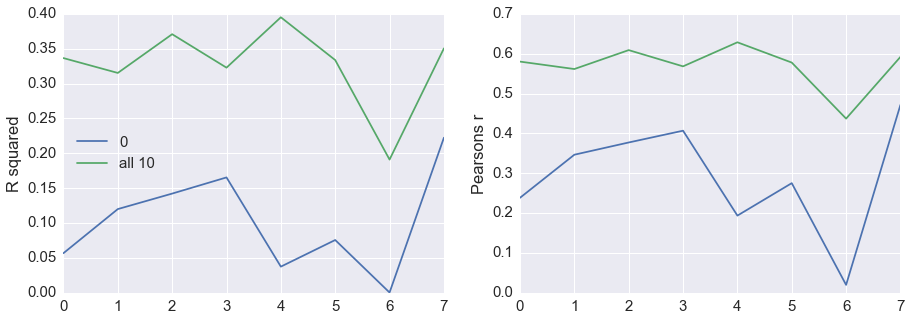

In [14]:
fig = plt.figure(figsize=(15,5))
sns.set_context('notebook', font_scale=1.5)

fig.add_subplot(121)
plt.plot(df_indv['score']['0'], label = '0')
plt.plot(df_indv['score']['0to10'], label = 'all 10')
plt.ylabel('R squared')
plt.legend(loc=0)

fig.add_subplot(122)
plt.plot(df_indv['corr']['0'], label = '0')
plt.plot(df_indv['corr']['0to10'], label = 'all 10')
plt.ylabel('Pearsons r')
#plt.legend()

In [17]:
print np.mean(df_indv['score']['0'])
print np.mean(df_indv['corr']['0'])
print np.mean(df_indv['score']['0to10'])
print np.mean(df_indv['corr']['0to10'])

0.102556406033
0.291112857915
0.326917493864
0.569210930604


In [36]:
subjects[5]

'PL6T'

In [29]:
sub = subjects[3]
t1_predict_indv_0 = load_pickle('/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1indv/%s_t1avg_by_fc_maps_0.pkl'%sub)
t1_predict_indv_10 = load_pickle('/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1indv/%s_t1avg_by_fc_maps_0to10.pkl'%sub)

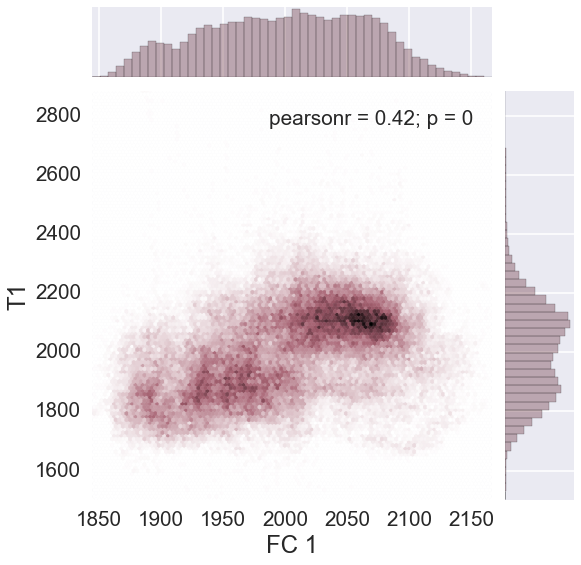

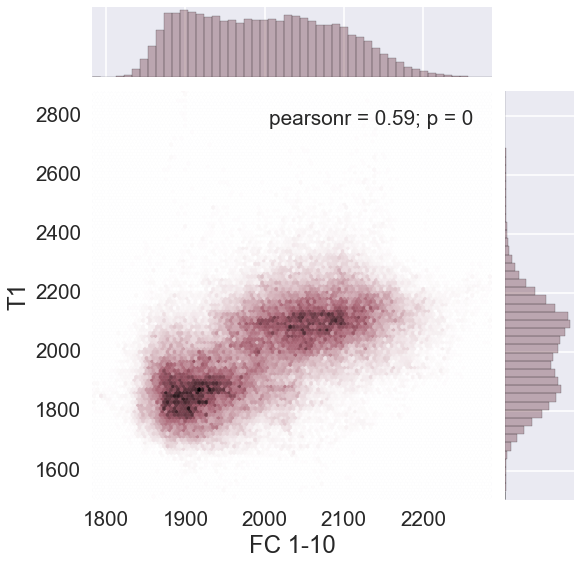

In [30]:
sns.set_style('darkgrid')
sns.set_context('poster', font_scale=1.3)

scatter_mask = np.where(t1_predict_indv_0['t1']>1500)
fig1b_1 = sns.jointplot(t1_predict_indv_0['modelled_fit'][scatter_mask], 
                             t1_predict_indv_0['t1'][scatter_mask], 
                             kind="hex", size=8, color=sns.xkcd_rgb['brownish purple'])
fig1b_1.set_axis_labels('FC 1', 'T1', fontsize=24)

fig1b_2 = sns.jointplot(t1_predict_indv_10['modelled_fit'][scatter_mask], 
                             t1_predict_indv_0['t1'][scatter_mask], 
                             kind="hex", size=8, color=sns.xkcd_rgb['brownish purple'])
fig1b_2.set_axis_labels('FC 1-10', 'T1', fontsize=24)

In [32]:
sub = subjects[6]
t1_predict_indv_0 = load_pickle('/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1indv/%s_t1avg_by_fc_maps_0.pkl'%sub)
t1_predict_indv_10 = load_pickle('/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1indv/%s_t1avg_by_fc_maps_0to10.pkl'%sub)

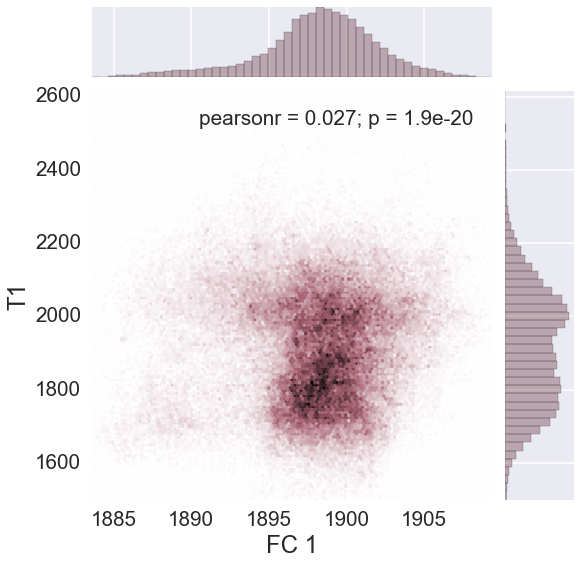

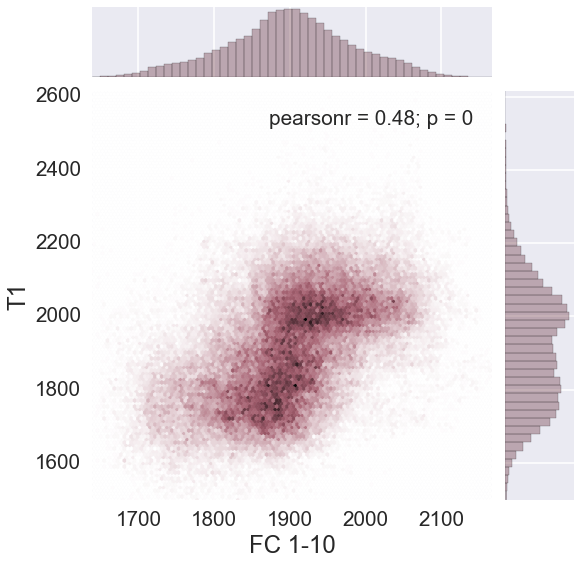

In [33]:
sns.set_style('darkgrid')
sns.set_context('poster', font_scale=1.3)

scatter_mask = np.where(t1_predict_indv_0['t1']>1500)
fig1b_1 = sns.jointplot(t1_predict_indv_0['modelled_fit'][scatter_mask], 
                             t1_predict_indv_0['t1'][scatter_mask], 
                             kind="hex", size=8, color=sns.xkcd_rgb['brownish purple'])
fig1b_1.set_axis_labels('FC 1', 'T1', fontsize=24)

fig1b_2 = sns.jointplot(t1_predict_indv_10['modelled_fit'][scatter_mask], 
                             t1_predict_indv_0['t1'][scatter_mask], 
                             kind="hex", size=8, color=sns.xkcd_rgb['brownish purple'])
fig1b_2.set_axis_labels('FC 1-10', 'T1', fontsize=24)

## Leftovers

### normalized embeddings

In [203]:
mesh_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/inflated/%s_lowres_new_infl50.vtk'
mask_file = '/scr/ilz3/myelinconnect/new_groupavg/masks/%s_fullmask.npy'
embed_dict_file = '/scr/ilz3/myelinconnect/new_groupavg/embed/%s_smooth_3_embed_dict.pkl'
sulc_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/sulc/%s_sulc.npy'
plot_file='/scr/ilz3/myelinconnect/new_groupavg/sfn/embed/%s_embed_norm_%s_%s.png'

cropped_embed = []
cropped_embed = []

for hemi in ['lh', 'rh']:
    v,f,d = read_vtk(mesh_file%hemi)
    mask = np.load(mask_file%hemi)
    sulc=np.load(sulc_file%hemi)

    # prepare embedding (normalized from entry in dict)
    pkl_in = open(embed_dict_file%(hemi), 'r')
    embed_dict=pickle.load(pkl_in)
    pkl_in.close()

    embed_masked = np.zeros((embed_dict['vectors'].shape[0], embed_dict['vectors'].shape[1]-1))
    for comp in range(10):
        embed_masked[:,comp]=(embed_dict['vectors'][:,comp+1]/embed_dict['vectors'][:,0])

    # unmask the embedding, that has been saved in masked form
    idcs=np.arange(0,v.shape[0])
    nonmask=np.delete(idcs, mask)
    embed = np.zeros((v.shape[0],10))
    embed[nonmask] = embed_masked

    sns.set_style('white')
    for comp in range(10):

        if hemi == 'lh':
            for (elev, azim) in [(180, 0), (180, 180)]:
                plot=plot_surf_stat_map(v, f, stat_map=embed[:,comp], bg_map=sulc, bg_on_stat=True, darkness=0.4, 
                                    elev=elev,azim=azim, figsize=(10,9) ,threshold=1e-50, cmap='viridis',symmetric_cbar='auto')
                cropped_images3_lh_green.append(crop_img(plot))

        if hemi == 'rh':
            for (elev, azim) in [(180, 0), (180, 180)]:
                plot=plot_surf_stat_map(v, f, stat_map=embed[:,comp], bg_map=sulc, bg_on_stat=True, darkness=0.4, 
                                    elev=elev,azim=azim, figsize=(10,7.5) ,threshold=1e-50, cmap='viridis',symmetric_cbar='auto')
                cropped_images3_rh_green.append(crop_img(plot))

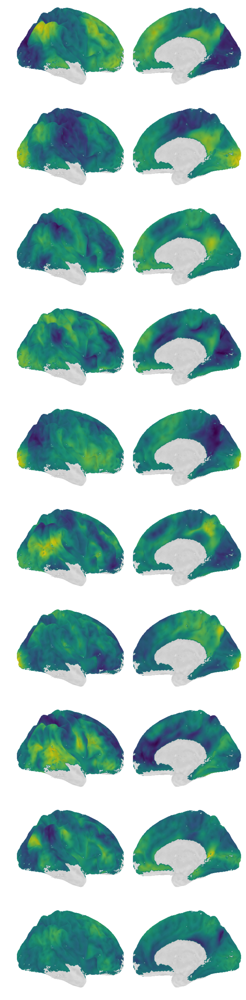

In [204]:
sns.set_style('white')
fig2a_right = plt.figure(figsize=(20,50))
for img in range(len(cropped_images3_rh)):
    ax = fig2a_right.add_subplot(10,2,img+1)
    plt.imshow(cropped_images3_rh_green[img])
    ax.set_axis_off()
fig2a_right.tight_layout()
fig2a_right.subplots_adjust(right=0.65)

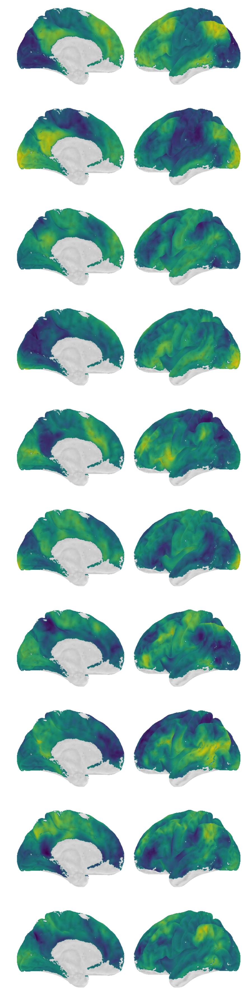

In [205]:
sns.set_style('white')
fig2a_left = plt.figure(figsize=(20,50))
for img in range(len(cropped_images3_lh)):
    ax = fig2a_left.add_subplot(10,2,img+1)
    plt.imshow(cropped_images3_lh_green[img])
    ax.set_axis_off()
fig2a_left.tight_layout()
fig2a_left.subplots_adjust(right=0.65)

In [206]:
fig2a_right.savefig('/scr/ilz3/myelinconnect/new_groupavg/sfn/fig2a_right_green.png')
fig2a_left.savefig('/scr/ilz3/myelinconnect/new_groupavg/sfn/fig2a_left_green.png')

### residuals

In [233]:
fit_df = pd.DataFrame(columns= ['corr lh', 'corr rh', 'score lh', 'score rh'])


In [234]:
maps=['0_to_10']+range(10)

In [235]:
# figure out vmax treshold for all maps
res_thrs = []

for m in maps:
    for hemi in ['lh', 'rh']:
        t1_predict_file = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1avg/%s_smooth_3_t1avg_by_fc_maps_%s.pkl'%(hemi, str(m))
        t1_predict = load_pickle(t1_predict_file)
        res_thrs.append(np.nanmin(t1_predict['residuals']))
        res_thrs.append(np.nanmax(t1_predict['residuals']))

res_thr = np.max(np.abs(res_thrs))
print res_thr

626.715570346


In [240]:
cropped_res_lh = []
cropped_res_rh = []

lh_mask = np.load('/scr/ilz3/myelinconnect/new_groupavg/masks/lh_fullmask.npy')
rh_mask = np.load('/scr/ilz3/myelinconnect/new_groupavg/masks/rh_fullmask.npy')

for m in maps:
    t1_predict_file_left = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1avg/lh_smooth_3_t1avg_by_fc_maps_%s.pkl'%str(m)
    t1_predict_file_right = '/scr/ilz3/myelinconnect/new_groupavg/model/linear_combination/t1avg/rh_smooth_3_t1avg_by_fc_maps_%s.pkl'%str(m)

    
    t1_predict_rh = load_pickle(t1_predict_file_right)
    t1_predict_lh = load_pickle(t1_predict_file_left)
    
    
    single_df = pd.DataFrame(columns= ['corr lh', 'corr rh', 'score lh','score rh'])
    single_df['corr lh'][str(m)] = t1_predict_lh['corr'][0]
    single_df['score lh'][str(m)] = t1_predict_lh['score']
    single_df['corr rh'][str(m)] = t1_predict_rh['corr'][0]
    single_df['score rh'][str(m)] = t1_predict_rh['score']
    fit_df = fit_df.append(single_df);
    
    
    one_sd_lh = t1_predict_lh['residuals'].copy()
    #res_mean_lh = np.mean(np.delete(one_sd_lh, lh_mask))
    #res_sd_lh =  np.std(np.delete(one_sd_lh, lh_mask))
    #one_sd_lh[np.where((one_sd_lh<(res_mean_lh+1*res_sd_lh)) & (one_sd_lh>(res_mean_lh-1*res_sd_lh)))]=0
    
    one_sd_rh = t1_predict_rh['residuals'].copy()
    #res_mean_rh = np.mean(np.delete(one_sd_rh, rh_mask))
    #res_sd_rh =  np.std(np.delete(one_sd_rh, rh_mask))
    #one_sd_rh[np.where((one_sd_rh<(res_mean_rh+1*res_sd_rh)) & (one_sd_rh>(res_mean_rh-1*res_sd_rh)))]=0

    
    sns.set_style('white')
    for (elev, azim) in [(180, 0), (180, 180)]:
        plot=plot_surf_stat_map(lv, lf, stat_map=one_sd_lh, bg_map=lh_sulc, bg_on_stat=True, darkness=0.4, 
                            elev=elev,azim=azim, figsize=(10,9) ,threshold=1e-50, cmap='RdBu_r',
                            symmetric_cbar='auto')
        cropped_res_lh.append(crop_img(plot))
        
    for (elev, azim) in [(180, 0), (180, 180)]:
        plot=plot_surf_stat_map(rv, rf, stat_map=one_sd_rh, bg_map=rh_sulc, bg_on_stat=True, darkness=0.4, 
                            elev=elev,azim=azim, figsize=(10,7.5) ,threshold=1e-50, cmap='RdBu_r',
                            symmetric_cbar='auto')
        cropped_res_rh.append(crop_img(plot))

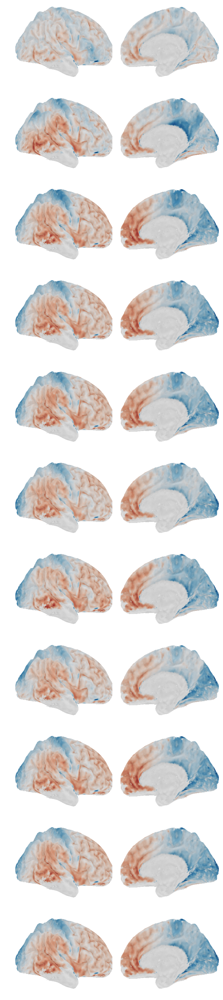

In [241]:
sns.set_style('white')
fig2b_right = plt.figure(figsize=(20,55))
for img in range(len(cropped_res_rh)):
    ax = fig2b_right.add_subplot(11,2,img+1)
    plt.imshow(cropped_res_rh[img])
    ax.set_axis_off()
fig2b_right.tight_layout()
fig2b_right.subplots_adjust(right=0.65)

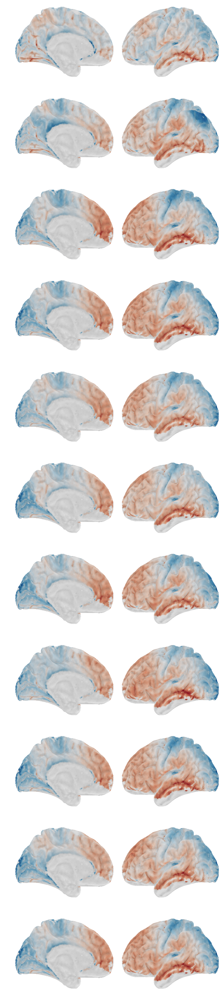

In [242]:
sns.set_style('white')
fig2b_left = plt.figure(figsize=(20,55))
for img in range(len(cropped_res_lh)):
    ax = fig2b_left.add_subplot(11,2,img+1)
    plt.imshow(cropped_res_lh[img])
    ax.set_axis_off()
fig2b_left.tight_layout()
fig2b_left.subplots_adjust(right=0.65)

### coefficients